<a href="https://colab.research.google.com/github/alirezasaharkhiz9/undergraduate-project-computer-vision/blob/main/Classical%20Computer%20Vision/ObjectDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection

in this lesson we'll learn:
1. [dilation, erosion](#dilation,-erosion)
2. [edge detection](#edge-detection)
3. [contour detection](#contour-detection)
4. [corner detection](#corner-detection)
5. [template matching](#template-matching)
6. [feature matching](#feature-matching)
7. [watershed algorithm](#watershed-algorithm)
8. [pedestrian detection with Haar Cascade Classifier](#pedestrian-detection-with-Haar-Cascade-Classifier)
9. [car detection with Haar Cascade Classifier](#car-detection-with-Haar-Cascade-Classifier)

## load libaray and imshow func

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def imshow(image=None, size=10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w / h
    plt.figure(figsize=(size * aspect_ratio, size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

## dilation, erosion

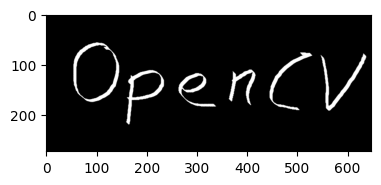

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/opencv_inv.png')
imshow(img)

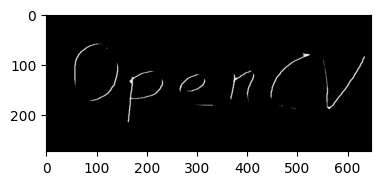

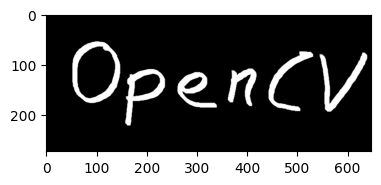

In [ ]:
kernel = np.ones((5, 5), np.uint8)

erosion = cv2.erode(img, kernel, iterations=1)
imshow(erosion)

dilation = cv2.dilate(img, kernel, iterations=1)
imshow(dilation)

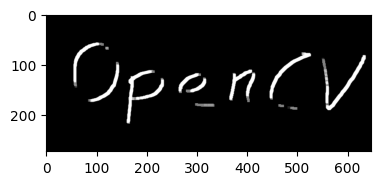

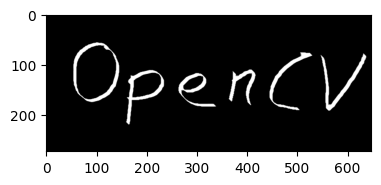

In [ ]:
# opening - good for remove noise
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
imshow(opening)

# closing
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
imshow(closing)

## edge detection

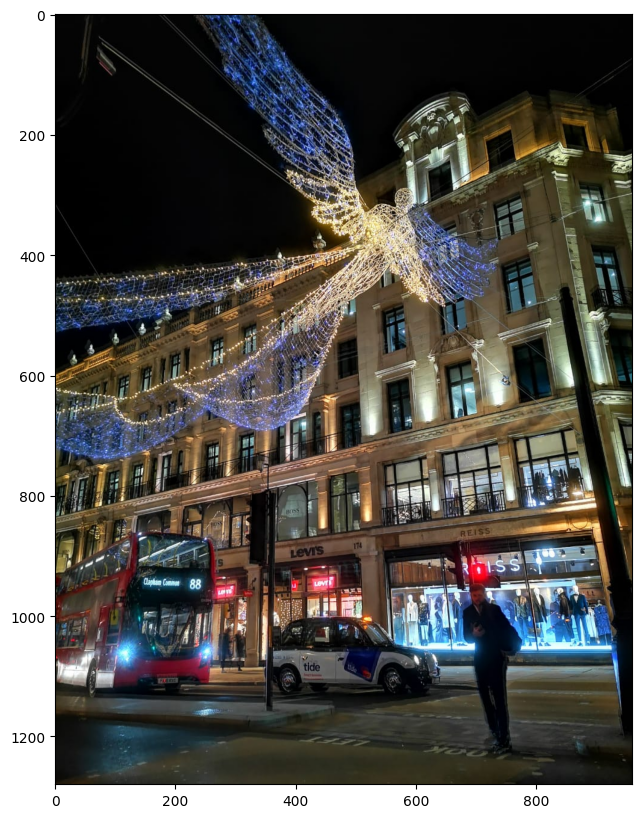

In [ ]:
# canny
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/londonxmas.jpeg')
imshow(img)

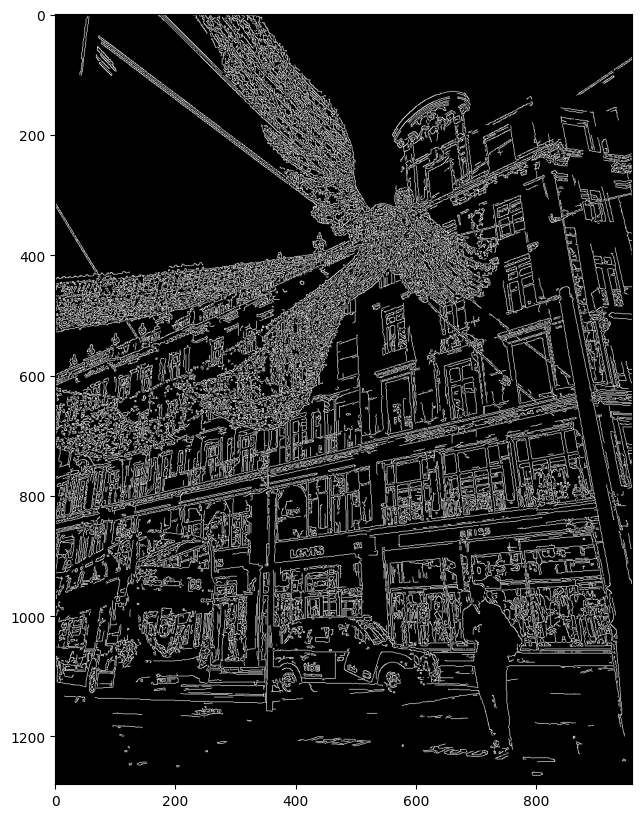

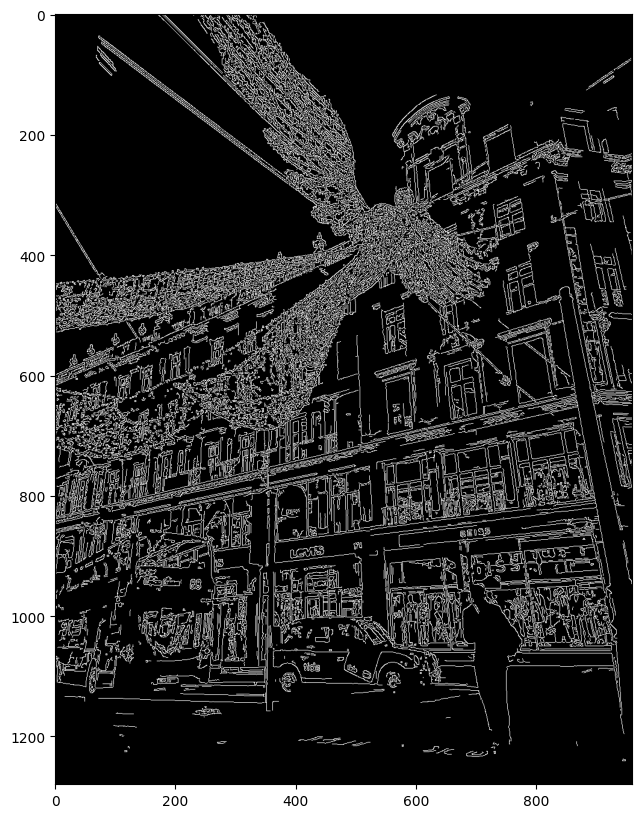

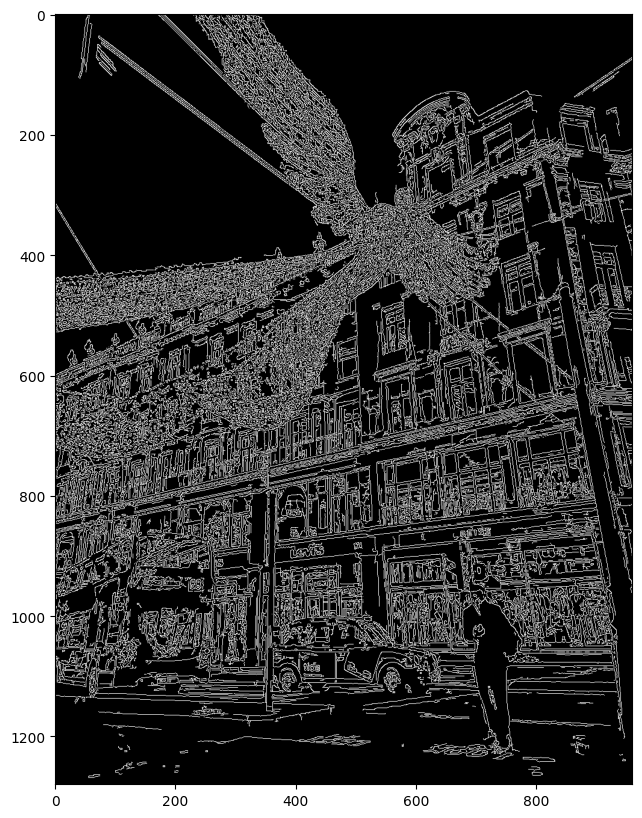

In [ ]:
canny = cv2.Canny(img, 100, 200)
imshow(canny)

canny = cv2.Canny(img, 125, 250)
imshow(canny)

canny = cv2.Canny(img, 50, 150)
imshow(canny)

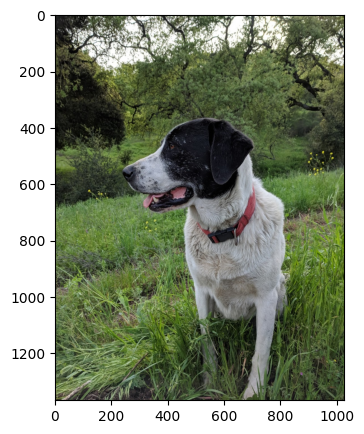

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/sammy.jpg')
imshow(img, 5)

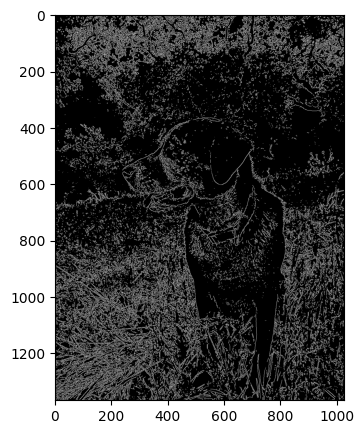

In [ ]:
canny = cv2.Canny(img, 180, 200)
imshow(canny, 5)

In [ ]:
def auto_canny(image):
  blur_img = cv2.GaussianBlur(image, (5, 5), 0)
  median_val = np.median(image)
  lower = int(max(0, 0.66 * median_val))
  upper = int(min(255, 1.33 * median_val))
  return cv2.Canny(blur_img, lower, upper)


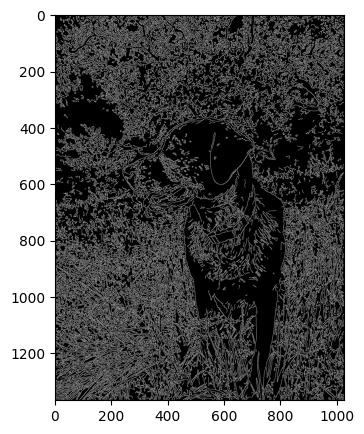

In [ ]:
canny = auto_canny(img)
imshow(canny, 5)

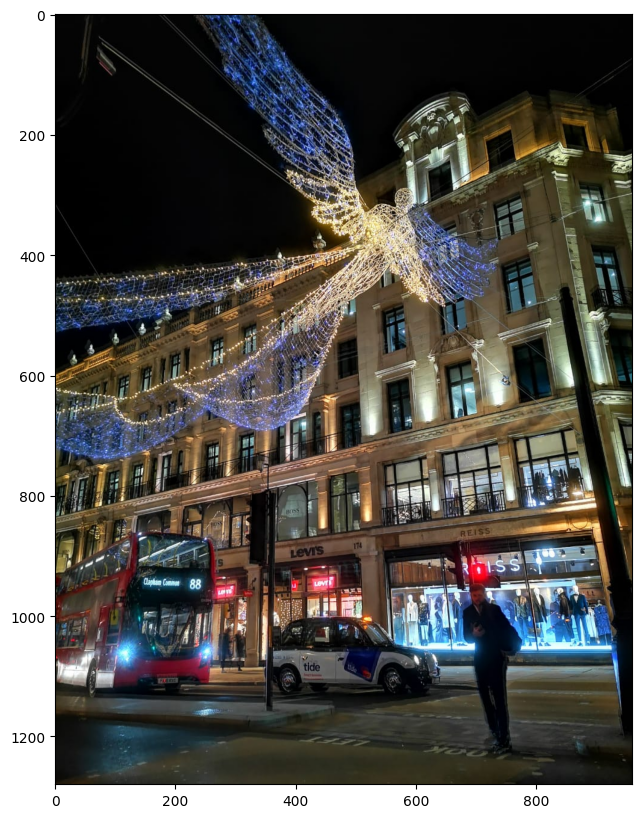

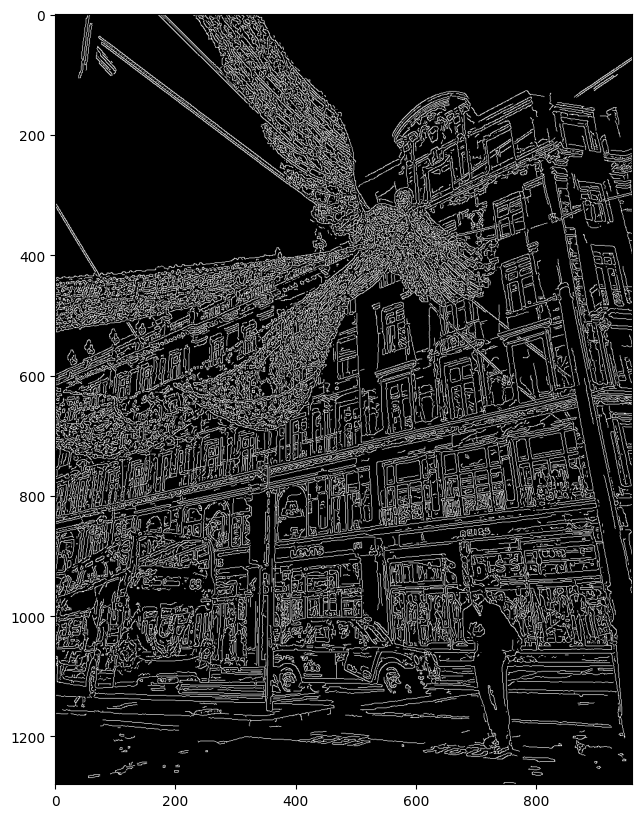

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/londonxmas.jpeg')
imshow(img)

canny = auto_canny(img)
imshow(canny)

## contour detection

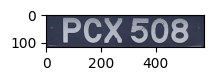

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/LP.jpg')
imshow(img)

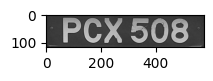

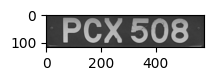

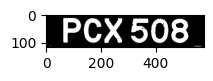

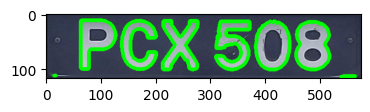

In [ ]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imshow(img_gray)

img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
imshow(img_blur)

img_thresh = cv2.threshold(img_blur, 127, 255, cv2.THRESH_BINARY)[1]
imshow(img_thresh)

contours, hierarchy = cv2.findContours(img_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

cv2.drawContours(img, contours, -1, (0, 255, 0), 5)
imshow(img, 20)

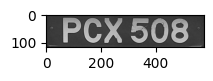

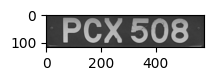

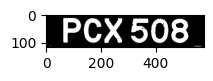

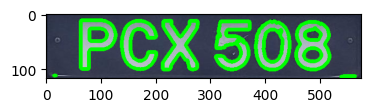

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/LP.jpg')

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imshow(img_gray)

img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
imshow(img_blur)

img_thresh = cv2.threshold(img_blur, 127, 255, cv2.THRESH_BINARY)[1]
imshow(img_thresh)

contours, hierarchy = cv2.findContours(img_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_)

cv2.drawContours(img, contours, -1, (0, 255, 0), 5)
imshow(img, 20)

## corner detection

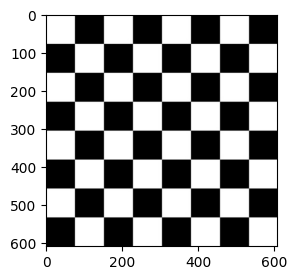

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/chess.JPG')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imshow(img, 3)

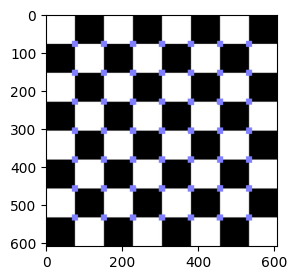

In [ ]:
# corner harris
gray_img = np.float32(gray_img)
corners = cv2.cornerHarris(gray_img, 3, 3, 0.05)

kernel = np.ones((7, 7), np.uint8)
corners = cv2.dilate(corners, kernel, iterations=2)

img[corners > 0.025 * corners.max()] = [255, 127, 127]
imshow(img, 3)

<ipython-input-60-4a2016218e42>:5: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corner = np.int0(corner)


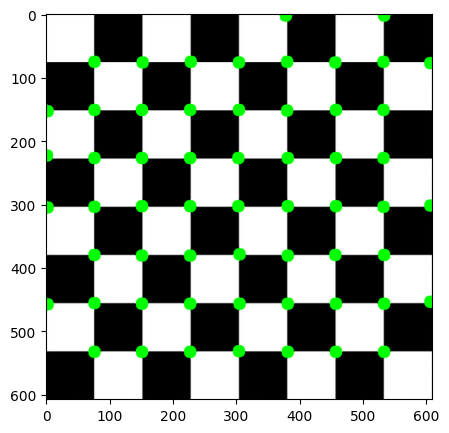

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/images/chess.JPG')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

corner = cv2.goodFeaturesToTrack(gray_img, 100, 0.001, 15)
corner = np.int0(corner)

for i in corner:
  x, y = i.ravel()
  cv2.circle(img, (x, y), 10, (0, 255, 0), -1)

imshow(img, 5)

## template matching

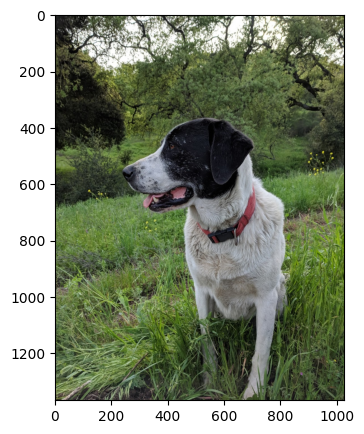

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/sammy.jpg')
imshow(img, 5)

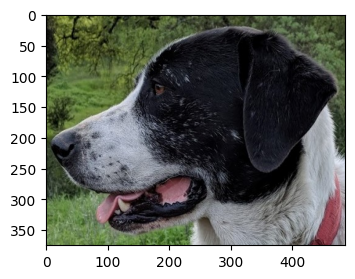

In [ ]:
img_face = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/sammy_face.jpg')
imshow(img_face, 5)

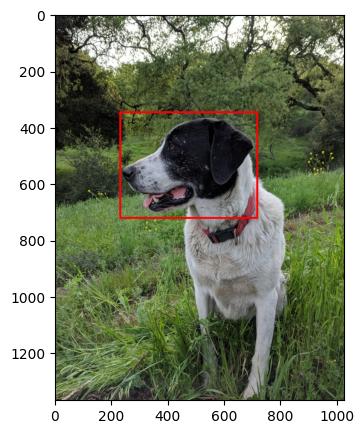

In [ ]:
# template matching
res = cv2.matchTemplate(img, img_face, cv2.TM_CCOEFF)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[0] + img_face.shape[1], top_left[1] + img_face.shape[0])
cv2.rectangle(img, top_left, bottom_right, (0, 0, 255), 5)
imshow(img, 5)

## feature matching

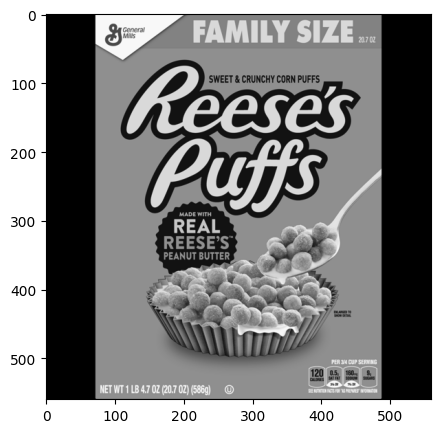

In [ ]:
reeses = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/reeses_puffs.png', 0)
imshow(reeses, 5)

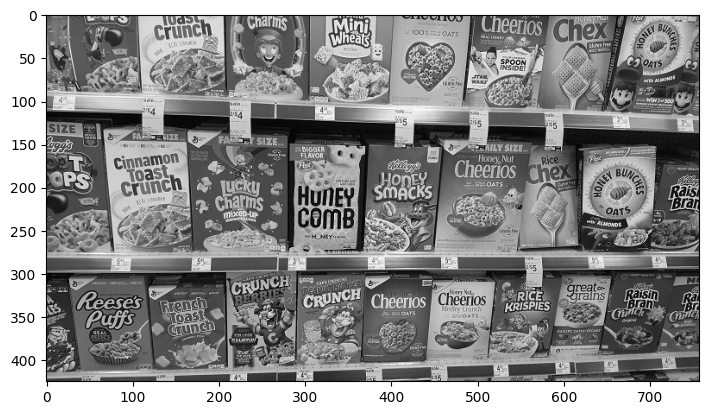

In [ ]:
cereal = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/many_cereals.jpg', 0)
imshow(cereal, 15)

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(reeses, None)
kp2, des2 = sift.detectAndCompute(cereal, None)

In [ ]:
# FLANN
index_params = dict(algorithm=0, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

In [ ]:
maches = flann.knnMatch(des1, des2, k=2)

In [ ]:
good = []

for m, n in maches:
  if m.distance < 0.7 * n.distance:
    good.append(m)

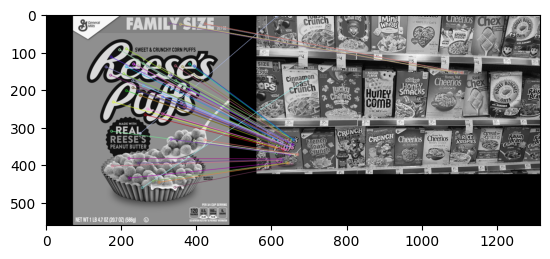

In [ ]:
flann_maches = cv2.drawMatches(reeses, kp1, cereal, kp2, good, None, flags=2)
imshow(flann_maches, 15)

## watershed algorithm

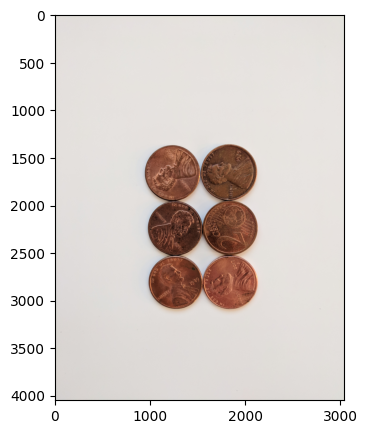

In [3]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/pennies.jpg')
imshow(img, 5)

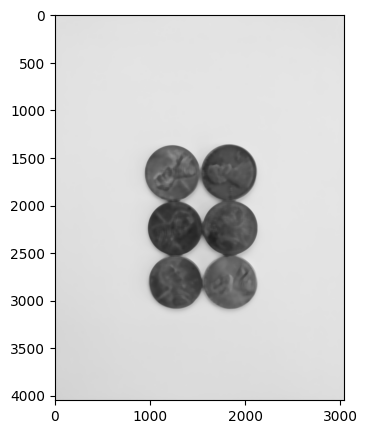

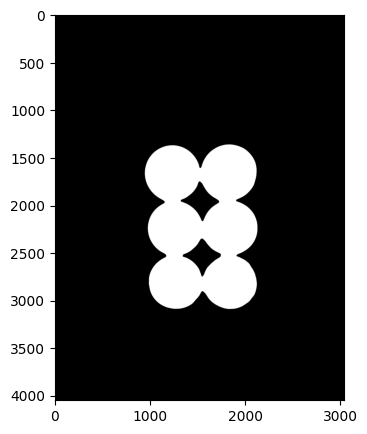

In [4]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_blur = cv2.medianBlur(img_gray, 35)
img_blur = cv2.GaussianBlur(img_blur, (7, 7), 0)
imshow(img_blur, 5)

thresh = cv2.threshold(img_blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
imshow(thresh, 5)

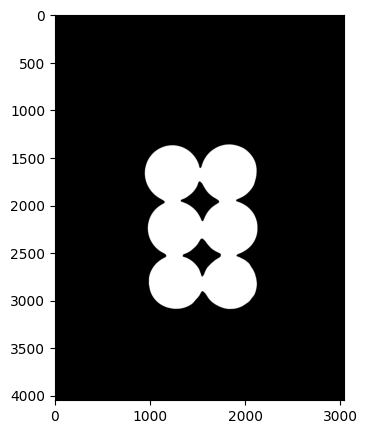

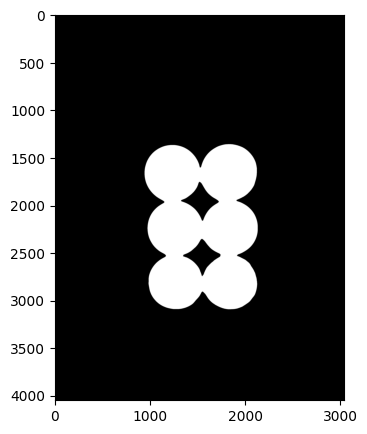

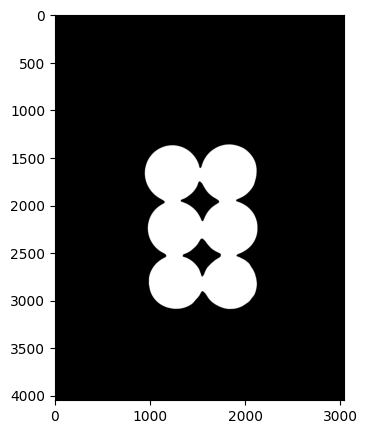

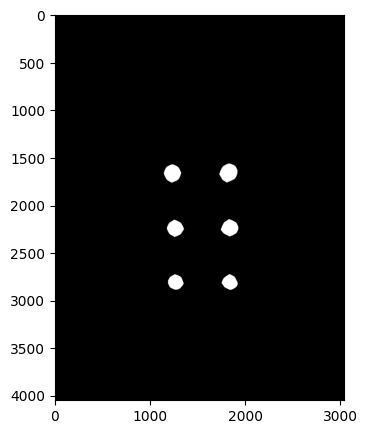

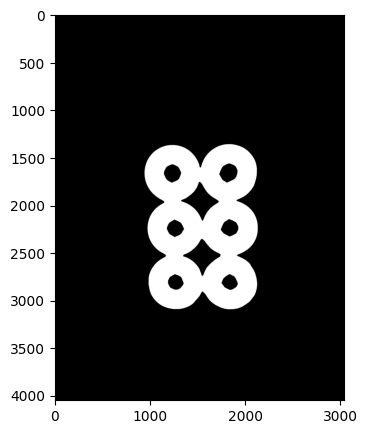

In [5]:
# noise removal
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
imshow(opening, 5)

sure_bg = cv2.dilate(opening, kernel, iterations=3)
imshow(sure_bg, 5)

dist_trans = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
imshow(dist_trans, 5)

ret, sure_fg = cv2.threshold(dist_trans, 0.7 * dist_trans.max(), 255, 0)
imshow(sure_fg, 5)

sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)
imshow(unknown, 5)

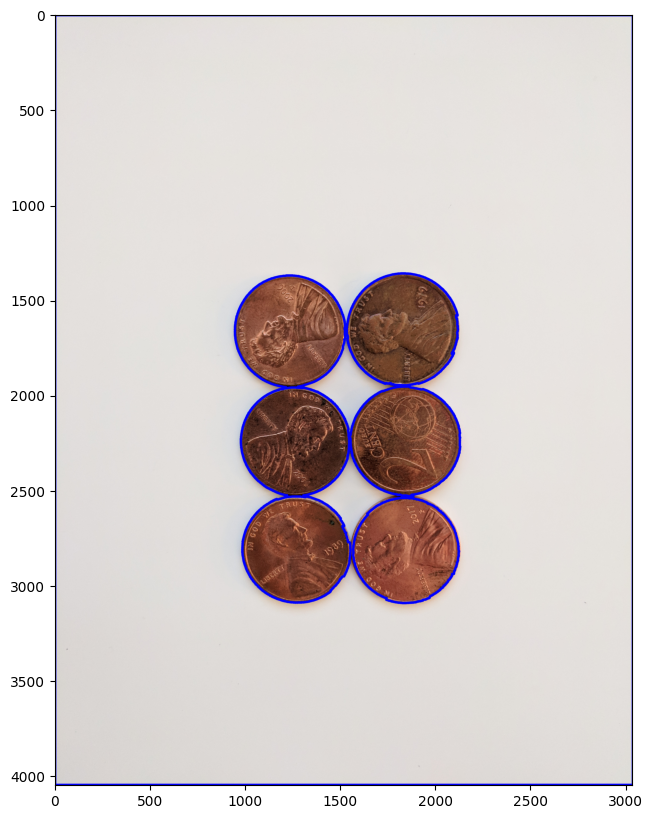

In [7]:
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

markers = cv2.watershed(img, markers)

contours, hierarchy = cv2.findContours(markers.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

for i in range(len(contours)):
  if hierarchy[0][i][3] == -1:
    cv2.drawContours(img, contours, i, (255, 0, 0), 10)


# img[markers.copy() == -1] = [255, 0, 0]
imshow(img)

## pedestrian detection with Haar Cascade Classifier
### Haar Cascade Classifier Overview

Haar Cascade is a machine learning model used for object detection, particularly in real-time applications like face detection. It involves several key steps:

#### 1. Data Collection
- **Positive Images**: Images containing the object of interest (e.g., faces).
- **Negative Images**: Images without the target object, used to help the algorithm distinguish between the object and the background.

#### 2. Haar Feature Extraction
- **Haar Features**: Represent contrasts between different regions of an image, such as edges and lines. These features are calculated using rectangular regions to detect differences in brightness between adjacent parts of the image.
- **Example**: A Haar feature might detect the dark eye region next to a bright forehead.

#### 3. Integral Image
- This technique speeds up feature computation by allowing the efficient calculation of pixel sums within rectangular regions, reducing computational complexity.

#### 4. Classifier Training (AdaBoost)
- **Weak Classifiers**: Each Haar feature serves as a weak classifier, which performs slightly better than random guessing.
- **AdaBoost**: This algorithm combines several weak classifiers into a strong one by giving more importance (weight) to misclassified samples, creating an overall robust model.

#### 5. Cascade of Classifiers
- The classifier is structured as a cascade of stages, where each stage consists of several weak classifiers.
- **Early Stages**: Quickly eliminate regions that do not contain the object.
- **Later Stages**: More detailed and computationally expensive, but only applied to regions that passed the early stages.

#### 6. Optimization and Evaluation
- After training, the model is tested on new data. Parameters can be fine-tuned to improve accuracy, ensuring it performs well in real-time detection tasks.


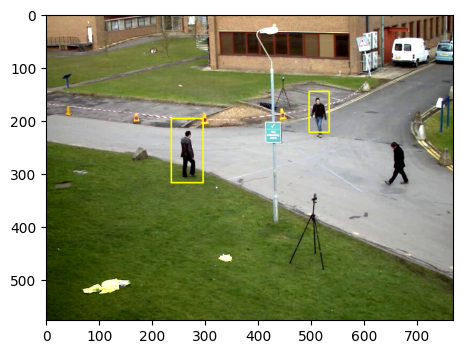

In [ ]:
# single frame
cap = cv2.VideoCapture('/content/drive/MyDrive/Colab Notebooks/DataSet/images/walking.avi')

body_classifier = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/haarcascades/haarcascade_fullbody.xml')

ret, frame = cap.read()

if ret:
  gray_img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  bodies = body_classifier.detectMultiScale(gray_img, 1.2, 3)

  for (x, y, w, h) in bodies:
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 255), 2)


cap.release()
imshow(frame, 7)


In [ ]:
# video
cap = cv2.VideoCapture('/content/drive/MyDrive/Colab Notebooks/DataSet/images/walking.avi')

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

out = cv2.VideoWriter('walking_output.avi', cv2.VideoWriter_fourcc('M', 'J', 'P', 'G'), 20, (w, h))

body_classifier = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/haarcascades/haarcascade_fullbody.xml')

while True:
  ret, frame = cap.read()

  if not ret:
    break

  gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  bodies = body_classifier.detectMultiScale(gray_frame, 1.2, 3)

  for (x, y, w, h) in bodies:
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 255), 2)

  out.write(frame)


cap.release()
out.release()

In [ ]:
# convert avi to mp4
!ffmpeg -i walking_output.avi walking_output.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('walking_output.mp4', 'rb').read()
data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()

HTML(f"""
<video width=400 controls>
  <source src={data_url} type='video/mp4'>
</video>
""")

## car detection with Haar Cascade Classifier

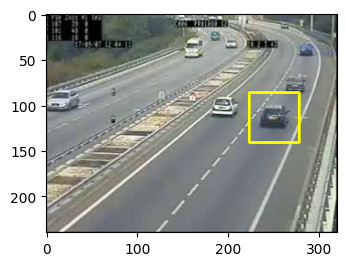

In [ ]:
# single frame
cap = cv2.VideoCapture('/content/drive/MyDrive/Colab Notebooks/DataSet/images/cars.avi')

car_classifier = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/haarcascades/haarcascade_car.xml')

ret, frame = cap.read()

if ret:
  gray_img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  cars = car_classifier.detectMultiScale(gray_img, 1.4, 2)

  for (x, y, w, h) in cars:
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 255), 2)

cap.release()
imshow(frame, 5)

In [ ]:
# video
cap = cv2.VideoCapture('/content/drive/MyDrive/Colab Notebooks/DataSet/images/cars.avi')

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

out = cv2.VideoWriter('car_output.avi', cv2.VideoWriter_fourcc('M', 'J', 'P', 'G'), 20, (w, h))

car_classifier = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/DataSet/DATA/haarcascades/haarcascade_car.xml')

while True:
  ret, frame = cap.read()

  if not ret:
    break

  gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  bodies = car_classifier.detectMultiScale(gray_frame, 1.2, 3)

  for (x, y, w, h) in bodies:
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 255), 2)

  out.write(frame)


cap.release()
out.release()

In [ ]:
# convert avi to mp4
!ffmpeg -i car_output.avi car_output.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('car_output.mp4', 'rb').read()
data_url = 'data:video/mp4;base64,' + b64encode(mp4).decode()

HTML(f"""
<video width=400 controls>
  <source src={data_url} type='video/mp4'>
</video>
""")